In [1]:
import mne
from autoreject import AutoReject
from autoreject import get_rejection_threshold
from mne.preprocessing import ICA
import toml
import mne_bids
import re
from pathlib import Path

mne.viz.set_browser_backend("matplotlib")
matplotlib.use("Agg")


config = toml.load("../../.env.toml")
project_path = config["project"]["path"]

Using matplotlib as 2D backend.


# <a id='toc1_'></a>[Question to discuss](#toc0_)

- Did I apply the right montage?
- What does the PRE mean in the data?


Reading EGI MFF Header from /Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff...


    Reading events ...
    Assembling measurement info ...
Reading 0 ... 300397  =      0.000 ...   300.397 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 45 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hamming window
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 5.00 Hz (-12 dB cutoff frequency: 47.50 Hz)
- Filter length: 3300 samples (13.200 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done 161 tasks      | elapsed:    0.3s


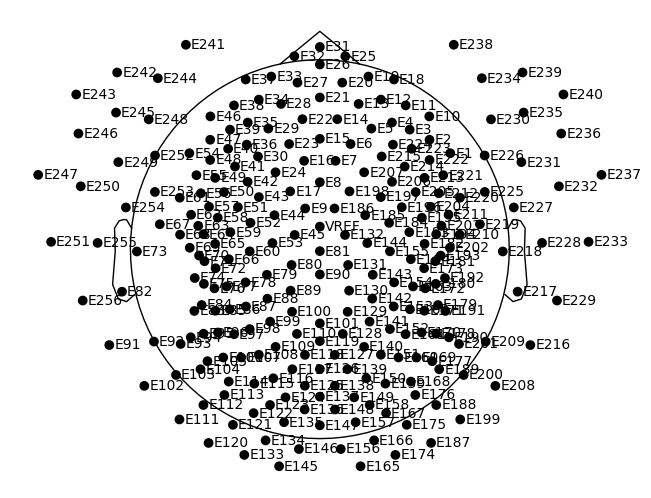

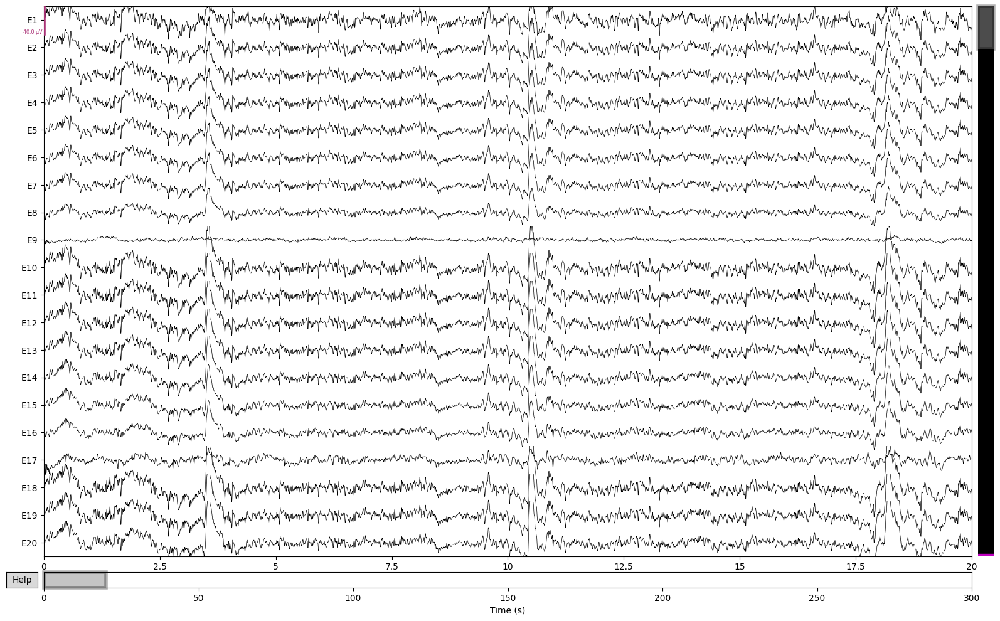

Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 100 events and 750 original time points ...
0 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


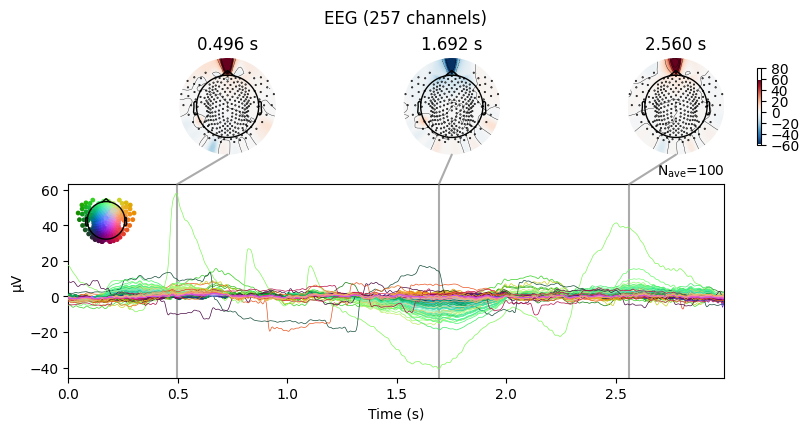

In [22]:
fname_path = "/Volumes/ExtremePro/DATA PATHS/DATI_PATHS/Raw_data/PATHS_101_Resting_20191120_022103.mff"

raw = mne.io.read_raw_egi(fname_path, preload=True)
raw.set_montage("GSN-HydroCel-257", match_alias={"VREF": "Cz"})

raw_downsampled = (
    raw.copy().crop(tmin=0, tmax=300, include_tmax=True).resample(sfreq=250)
)

filter_params = {
    "l_freq": 0.5,
    "h_freq": 45,
    "h_trans_bandwidth": 5,
    "fir_design": "firwin2",
    "phase": "zero-double",
}
raw_filtered = raw_downsampled.filter(**filter_params)  # removedrifts

# raw.info['line_freq'] = 50.
# freqs = (50, 100)
# eeg_picks = mne.pick_types(raw.info, eeg=True)

# raw_notch = raw_filtered.copy().notch_filter(freqs=freqs, picks=eeg_picks)
raw_filtered.plot_sensors(show_names=True)

_ = mne.viz.plot_raw(raw_filtered, duration=20.0)

epochs = mne.make_fixed_length_epochs(raw_filtered, duration=3, preload=True)
# plot the data
_ = epochs.copy().average().detrend().plot_joint()

Estimating rejection dictionary for eeg
The rejection dictionary is {'eeg': 0.00035870725431649494}
0 bad epochs dropped


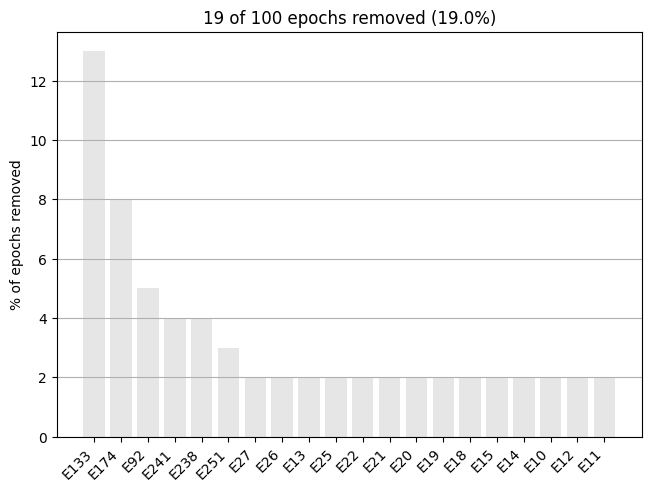

In [26]:
reject = get_rejection_threshold(epochs)
print("The rejection dictionary is %s" % reject)
epochs.copy().drop_bad(reject=reject)
epochs.plot_drop_log()

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.5 mm
Computing interpolation matrix from 255 sensor positions
Interpolating 2 sensors
Not setting metadata
100 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 100 events and 750 original time points ...
0 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


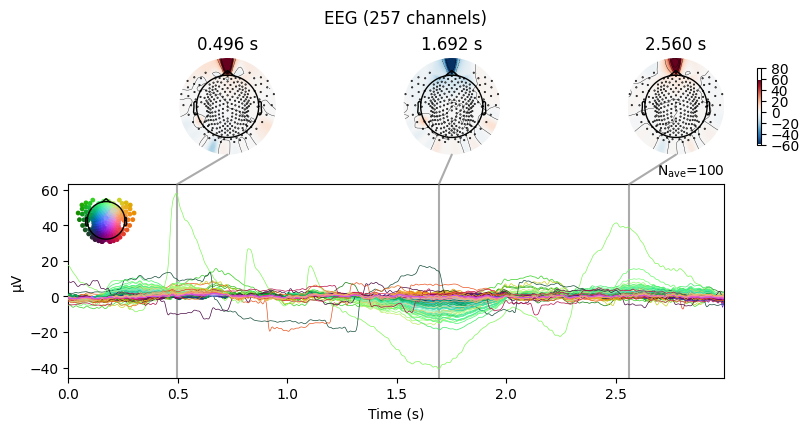

In [29]:
raw_notch_interp = raw_filtered.copy()
raw_notch_interp.info["bads"].extend(
    ["E133", "E174"])  # add a list of channels
raw_notch_interp = raw_notch_interp.interpolate_bads(reset_bads=False)


epochs = mne.make_fixed_length_epochs(raw_filtered, duration=3, preload=True)
# plot the data
_ = epochs.copy().average().detrend().plot_joint()

In [23]:
from autoreject import Ransac

rsc = Ransac()
epochs_clean = rsc.fit_transform(epochs)

  0%|          | interpolating channels : 0/50 [00:00<?,       ?it/s]

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   15.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   15.7s


  0%|          | Iterating epochs : 0/100 [00:00<?,       ?it/s]

/Users/daniel/.pyenv/versions/brainlat-3.11.8/lib/python3.11/site-packages/autoreject/ransac.py:164: RuntimeWarning: invalid value encountered in divide
  corr = num / denom


[Done]
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.5 mm
Computing interpolation matrix from 209 sensor positions


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   38.3s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   38.3s


Interpolating 48 sensors


No projector specified for this dataset. Please consider the method self.add_proj.


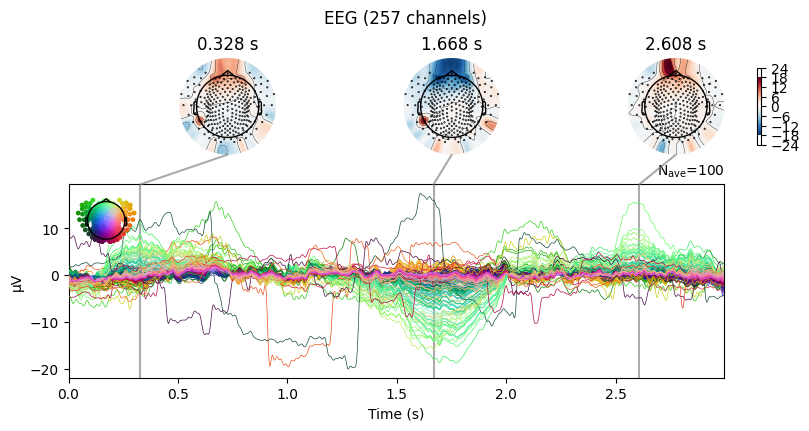

In [24]:
_ = epochs_clean.copy().average().detrend().plot_joint()

**Table of contents**<a id='toc0_'></a>

- [Question to discuss](#toc1_)
- [Analysis](#toc2_)
- [Drop epochs](#toc3_)
- [ICA](#toc4_)

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->


Not setting metadata
29 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 29 events and 2500 original time points ...


0 bad epochs dropped
No projector specified for this dataset. Please consider the method self.add_proj.


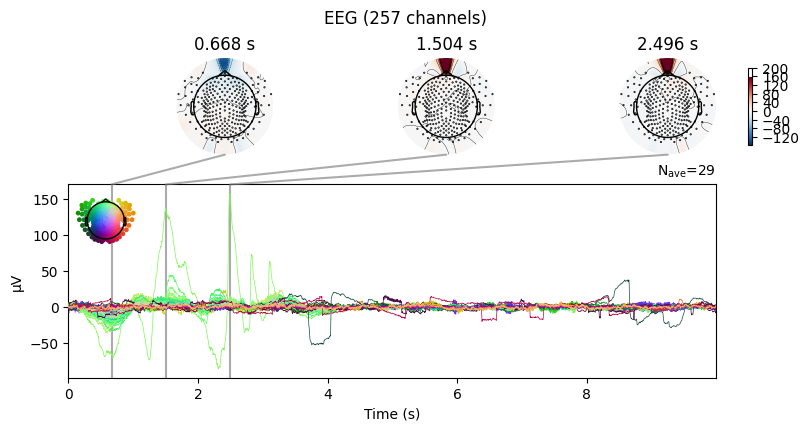

# <a id='toc2_'></a>[Analysis](#toc0_)


Effective window size : 8.192 (s)


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_13983/1940464241.py:1: UserWarning: Zero value in spectrum for channel VREF
  spectrum = raw_notch.compute_psd()
/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_13983/1940464241.py:2: UserWarning: Infinite value in PSD for channel VREF.
These channels might be dead.
  _ = spectrum.plot(average=True, picks="data", exclude="bads");
/Users/daniel/.pyenv/versions/brainlat-3.12.1/lib/python3.12/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


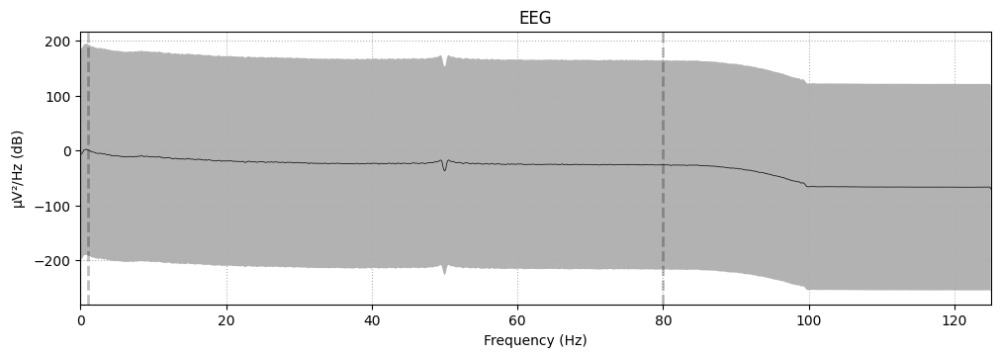

In [3]:
spectrum = raw_notch.compute_psd()
_ = spectrum.plot(average=True, picks="data", exclude="bads")

Fitting ICA to data using 257 channels (please be patient, this may take a while)


Selecting by number: 40 components
Fitting ICA took 45.6s.


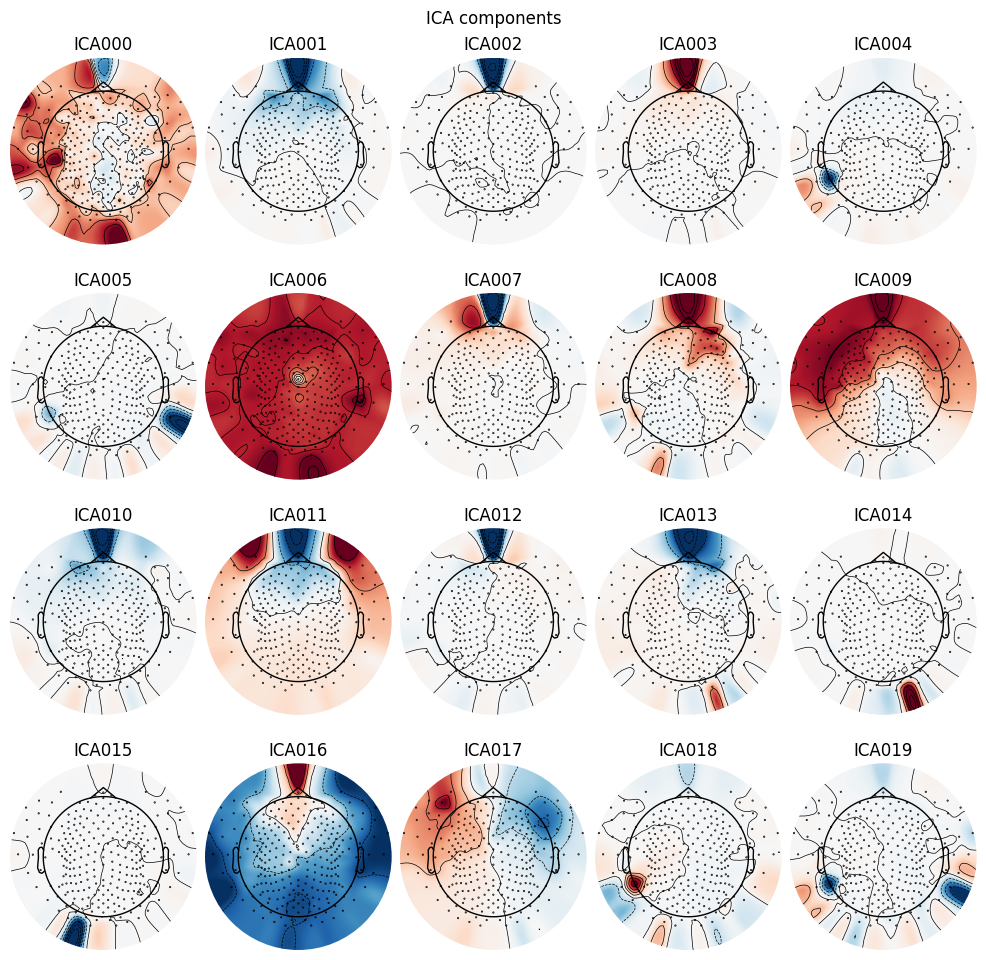

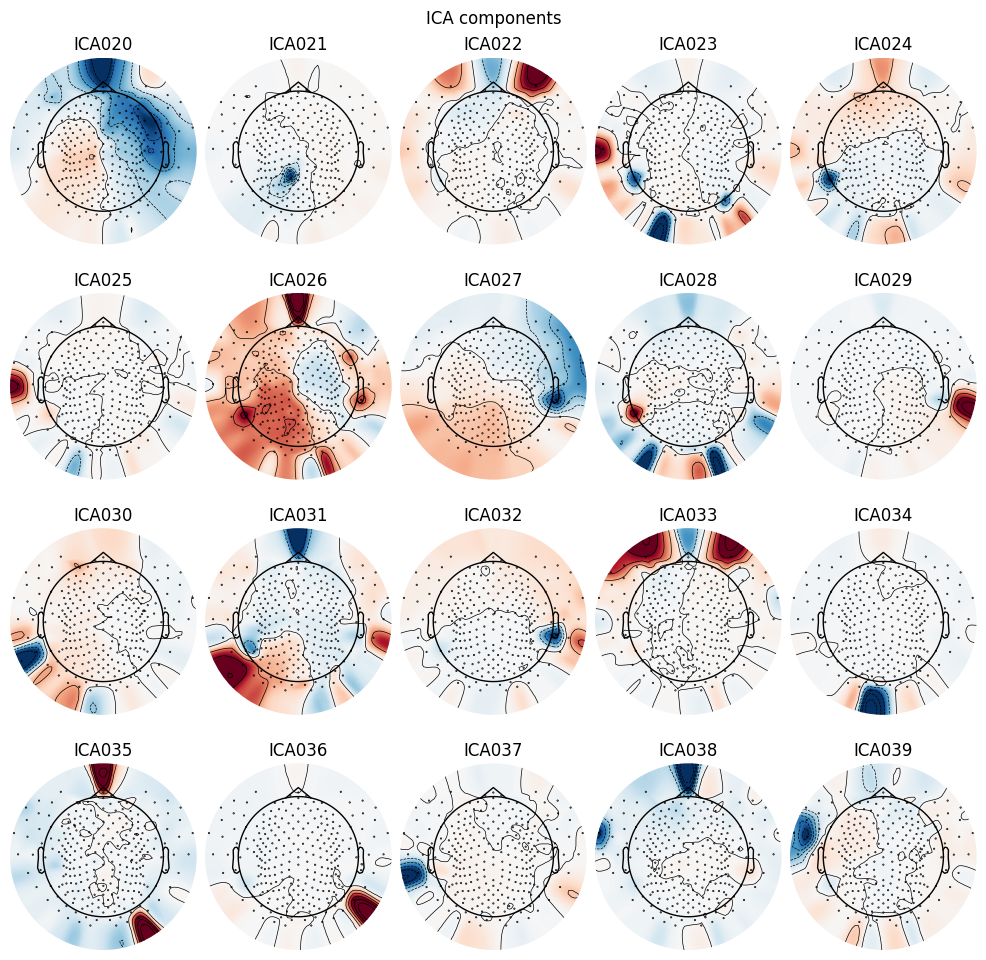

In [4]:
# Set up ICA
ica = mne.preprocessing.ICA(n_components=40, random_state=42)

# Fit ICA to the data
ica.fit(raw_notch)

# Plot ICA components for inspection
_ = ica.plot_components()

Creating RawArray with float64 data, n_channels=41, n_times=74251
    Range : 750 ... 75000 =      3.000 ...   300.000 secs
Ready.


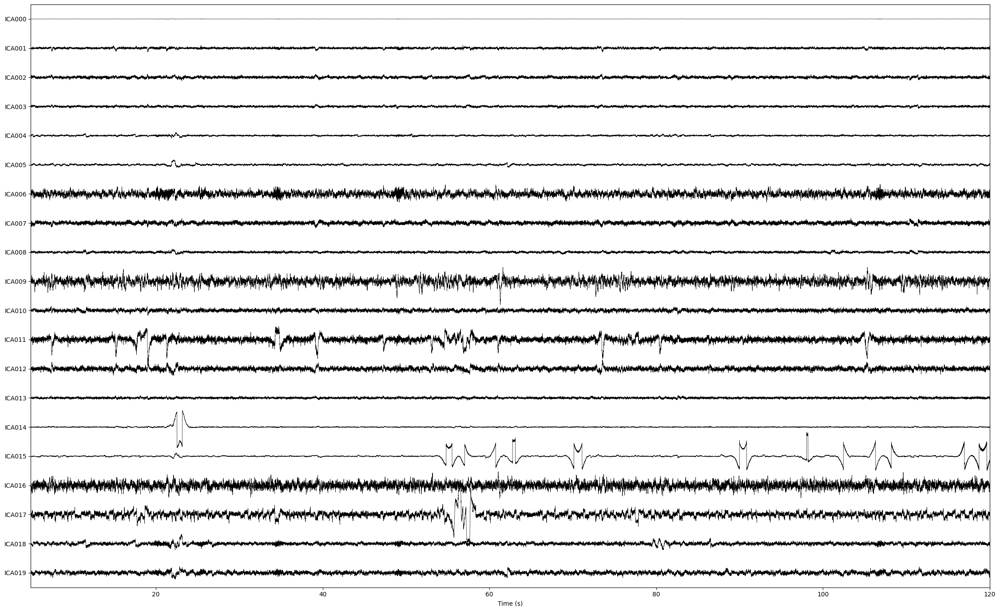

In [22]:
_ = ica.plot_sources(raw_notch, show_scrollbars=False, start=5.0, stop=120.0)

Not setting metadata
99 matching events found
No baseline correction applied
0 projection items activated


Using data from preloaded Raw for 99 events and 751 original time points ...
1 bad epochs dropped
Fitting ICA to data using 257 channels (please be patient, this may take a while)
Selecting by number: 25 components
Fitting ICA took 41.7s.


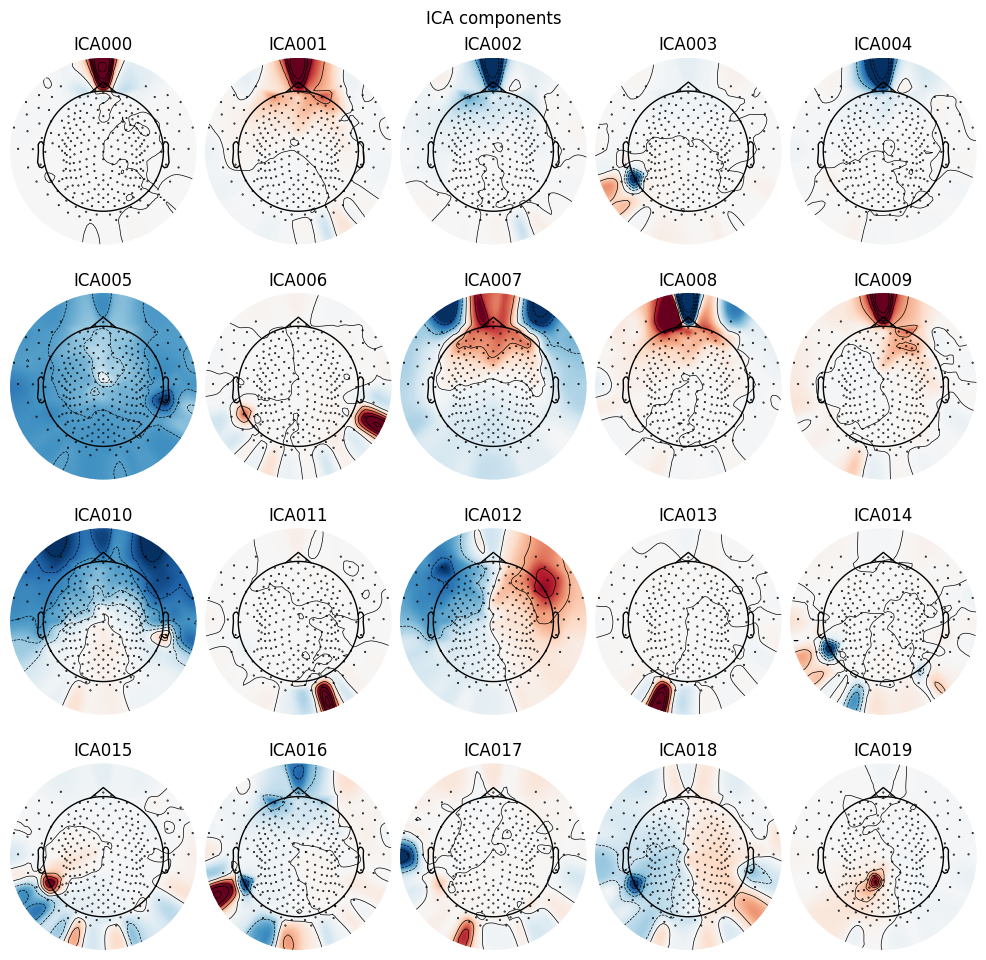

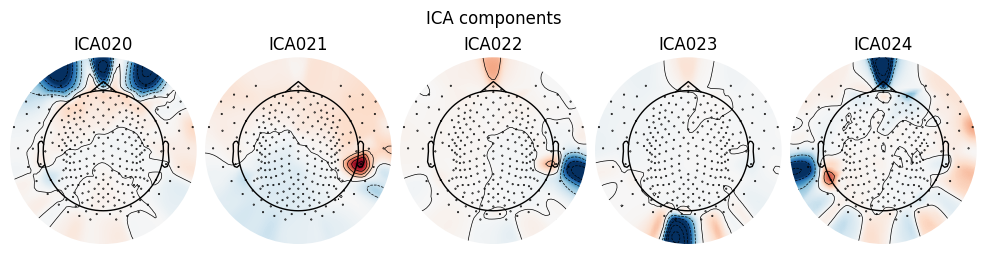

In [23]:
events = mne.make_fixed_length_events(
    raw=raw_notch, start=0, stop=None, duration=3, overlap=0, first_samp=False
)

# Create  Epochs object
epochs = mne.Epochs(
    raw=raw_notch, events=events, tmin=0, tmax=3, detrend=1, baseline=None, preload=True
)

# Set up ICA
ica = mne.preprocessing.ICA(n_components=25, random_state=42)

# Fit ICA to the data
ica.fit(epochs)

# Plot ICA components for inspection
_ = ica.plot_components()

In [17]:
_ = ica.plot_sources(epochs[:1], show_scrollbars=False, start=5.0, stop=120.0)

Not setting metadata
1 matching events found
No baseline correction applied
0 projection items activated


IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

In [ ]:
# Identify and exclude artifact-related components (requires manual review)
ica.exclude = [0, 2]  # Example: Exclude components 0 and 2

# Apply ICA cleaning
ica.apply(raw)

# <a id='toc3_'></a>[Drop epochs](#toc0_)


Not setting metadata
297 matching events found


No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 297 events and 250 original time points ...
0 bad epochs dropped
Estimating rejection dictionary for eeg
The rejection dictionary is {'eeg': 0.0001654099024527577}
Using data from preloaded Raw for 297 events and 250 original time points ...
    Rejecting  epoch based on EEG : ['E31', 'E91', 'E133']
    Rejecting  epoch based on EEG : ['E133', 'E174']
    Rejecting  epoch based on EEG : ['E174']
    Rejecting  epoch based on EEG : ['E31', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E91', 'E174']
    Rejecting  epoch based on EEG : ['E174']
    Rejecting  epoch based on EEG : ['E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E133']
   

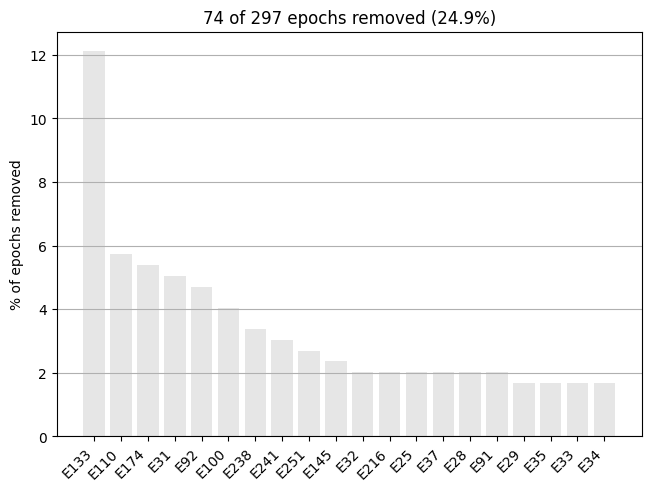

In [16]:
epochs = mne.make_fixed_length_epochs(
    raw_notch, duration=1.0, preload=False, proj=True)
reject = get_rejection_threshold(epochs)
print("The rejection dictionary is %s" % reject)
epochs.drop_bad(reject=reject)
epochs.plot_drop_log()

In [17]:
raw_notch_interp = raw_notch.copy()
raw_notch_interp.info["bads"].extend(["E156"])  # add a list of channels
raw_notch_interp = raw_notch_interp.interpolate_bads(reset_bads=False)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.5 mm
Computing interpolation matrix from 256 sensor positions
Interpolating 1 sensors


Not setting metadata
297 matching events found
No baseline correction applied


0 projection items activated
Using data from preloaded Raw for 297 events and 250 original time points ...
0 bad epochs dropped
Estimating rejection dictionary for eeg
The rejection dictionary is {'eeg': 0.0001654099024527577}
Using data from preloaded Raw for 297 events and 250 original time points ...
    Rejecting  epoch based on EEG : ['E31', 'E91', 'E133']
    Rejecting  epoch based on EEG : ['E133', 'E174']
    Rejecting  epoch based on EEG : ['E174']
    Rejecting  epoch based on EEG : ['E31', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E91', 'E174']
    Rejecting  epoch based on EEG : ['E174']
    Rejecting  epoch based on EEG : ['E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E100', 'E110']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG 

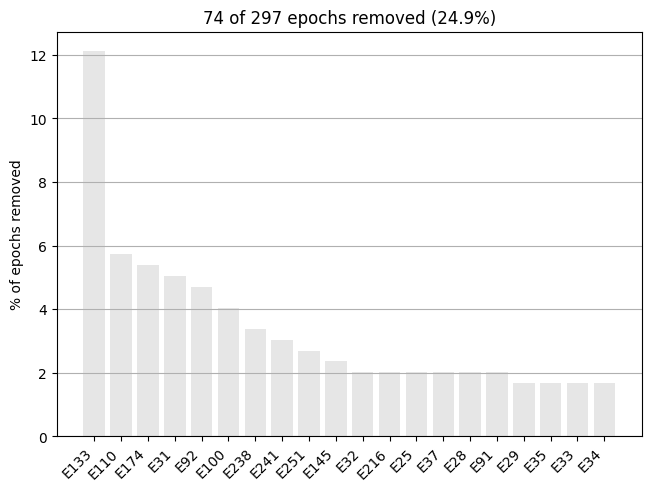

In [18]:
epochs = mne.make_fixed_length_epochs(
    raw_notch_interp, duration=1.0, preload=False, proj=True
)
reject = get_rejection_threshold(epochs)
print("The rejection dictionary is %s" % reject)
epochs.drop_bad(reject=reject)
epochs.plot_drop_log()

# <a id='toc4_'></a>[ICA](#toc0_)


In [19]:
def run_ica(raw_notch_interp):
    ica = ICA(n_components=20, max_iter="auto", random_state=97)
    ica.fit(raw_notch_interp)
    ica

    explained_var_ratio = ica.get_explained_variance_ratio(raw_notch_interp)
    for channel_type, ratio in explained_var_ratio.items():
        print(
            f"Fraction of {channel_type} variance explained by all components: "
            f"{ratio}"
        )

    explained_var_ratio = ica.get_explained_variance_ratio(
        raw_notch_interp, components=[0], ch_type="eeg"
    )
    # This time, print as percentage.
    ratio_percent = round(100 * explained_var_ratio["eeg"])
    print(
        f"Fraction of variance in EEG signal explained by first component: "
        f"{ratio_percent}%"
    )
    return ica


ica = run_ica(raw_notch_interp)

Fitting ICA to data using 256 channels (please be patient, this may take a while)


Selecting by number: 20 components
Fitting ICA took 15.2s.
Fraction of eeg variance explained by all components: 0.9941525037035492
Fraction of variance in EEG signal explained by first component: 71%


Using data from preloaded Raw for 223 events and 250 original time points ...


Using data from preloaded Raw for 223 events and 250 original time points ...
Not setting metadata
223 matching events found
No baseline correction applied
0 projection items activated


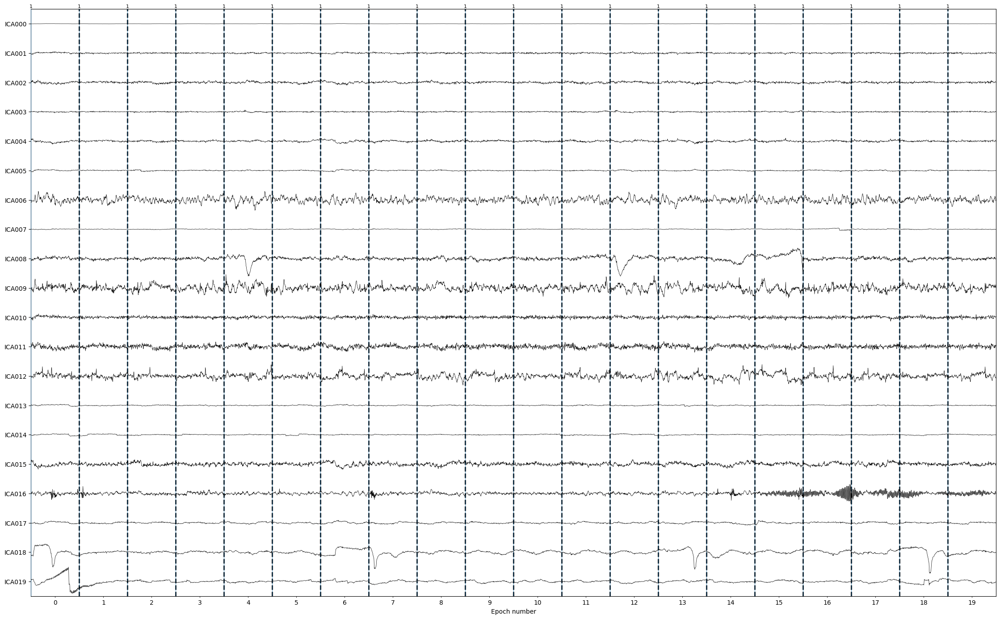

In [21]:
_ = ica.plot_sources(epochs, show_scrollbars=False)

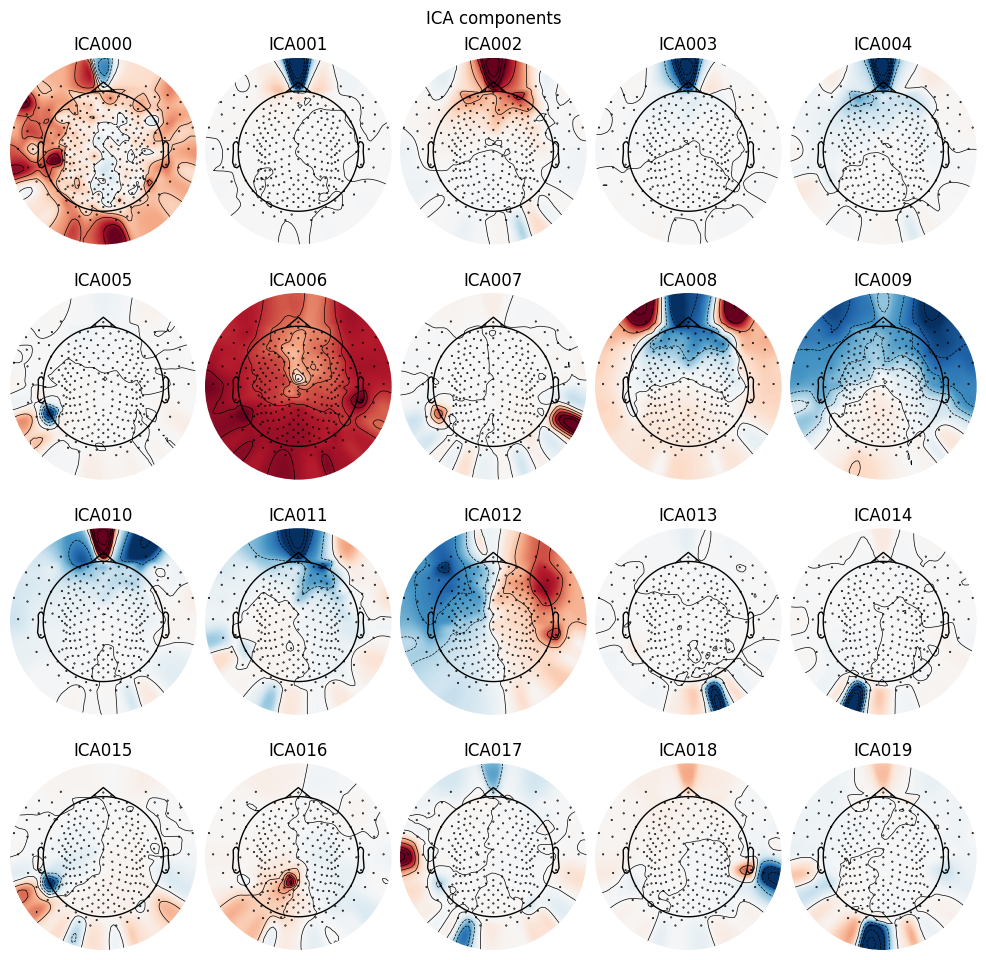

In [22]:
ica.plot_components()

In [23]:
# indices chosen based on various plots above
ica.exclude = [9, 10, 13, 16, 17]
reconst_raw = raw_notch_interp.copy()
ica.apply(reconst_raw)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 5 ICA components
    Projecting back using 256 PCA components


Measurement date,"November 20, 2019 13:21:02 GMT"
Experimenter,Unknown
Participant,Unknown
Digitized points,260 points
Good channels,"256 EEG, 1 ECG"
Bad channels,E156
EOG channels,Not available
ECG channels,ECG
Sampling frequency,250.00 Hz
Highpass,1.00 Hz
Lowpass,80.00 Hz


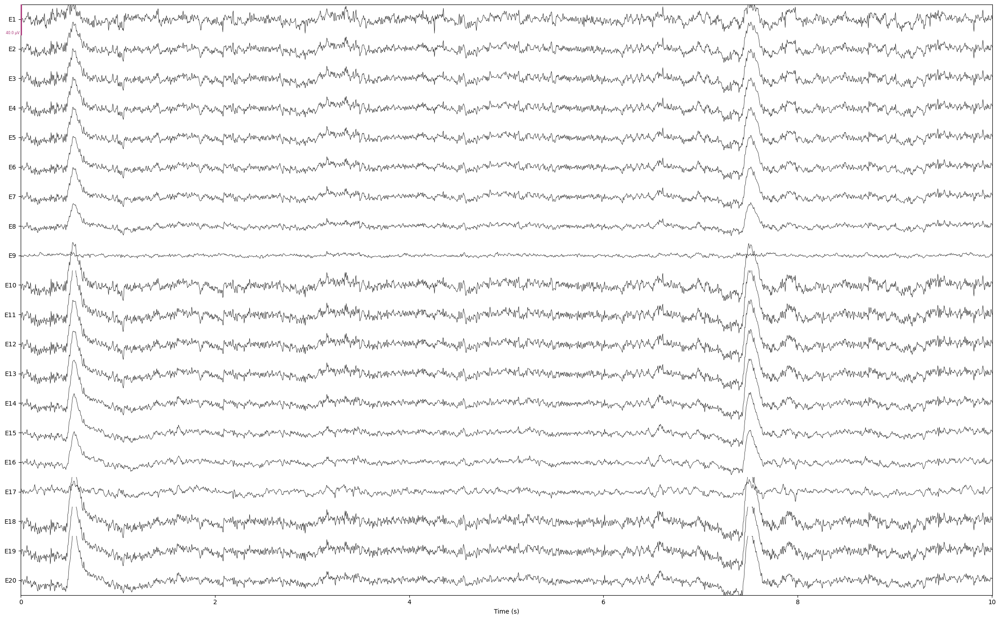

In [25]:
_ = reconst_raw.plot(show_scrollbars=False)

Not setting metadata
99 matching events found


No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 99 events and 750 original time points ...
0 bad epochs dropped
Estimating rejection dictionary for eeg
The rejection dictionary is {'eeg': 0.00033302694701115335}
Using data from preloaded Raw for 99 events and 750 original time points ...
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E133']
    Rejecting  epoch based on EEG : ['E2', 'E3', 'E4', 'E5', 'E6', 'E7', 'E8', 'E10', 'E11', 'E12', 'E13', 'E14', 'E15', 'E16

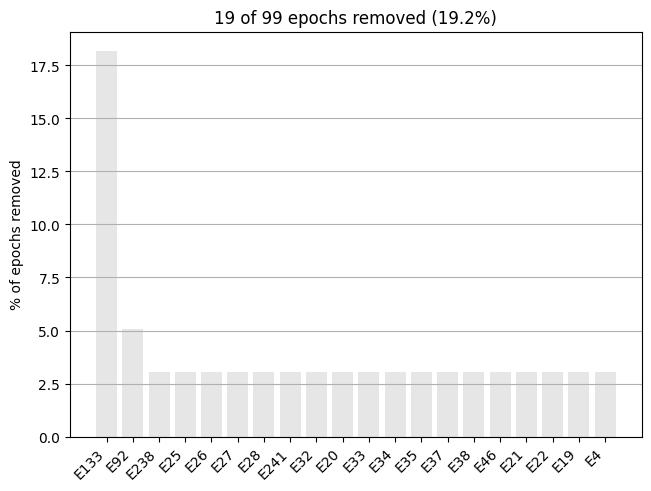

In [27]:
epochs = mne.make_fixed_length_epochs(
    reconst_raw, duration=3.0, preload=False, proj=True
)
reject = get_rejection_threshold(epochs)
print("The rejection dictionary is %s" % reject)
epochs.drop_bad(reject=reject)
epochs.plot_drop_log()

Using data from preloaded Raw for 80 events and 750 original time points ...


0 bad epochs dropped
Using data from preloaded Raw for 20 events and 750 original time points ...


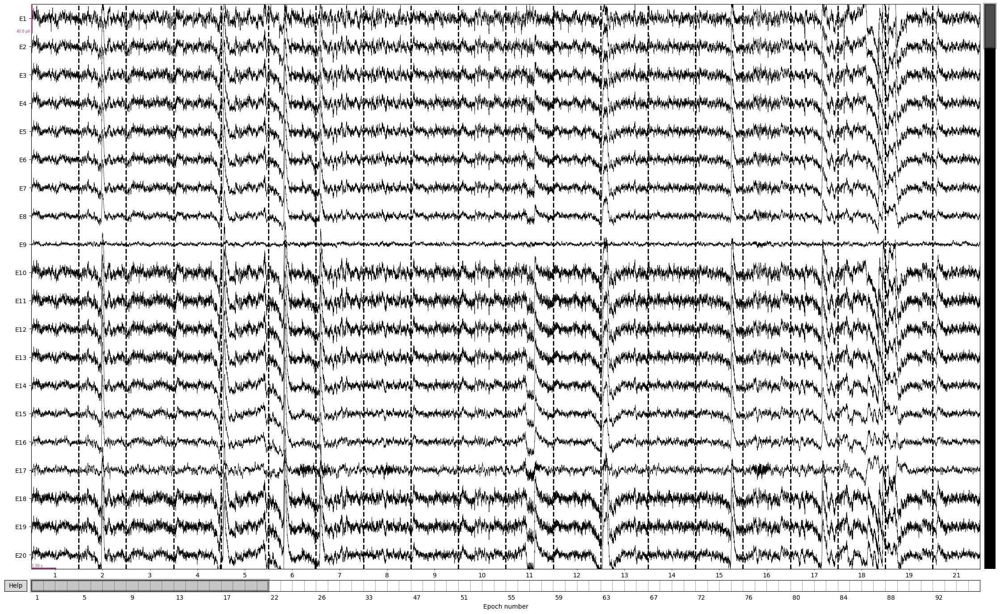

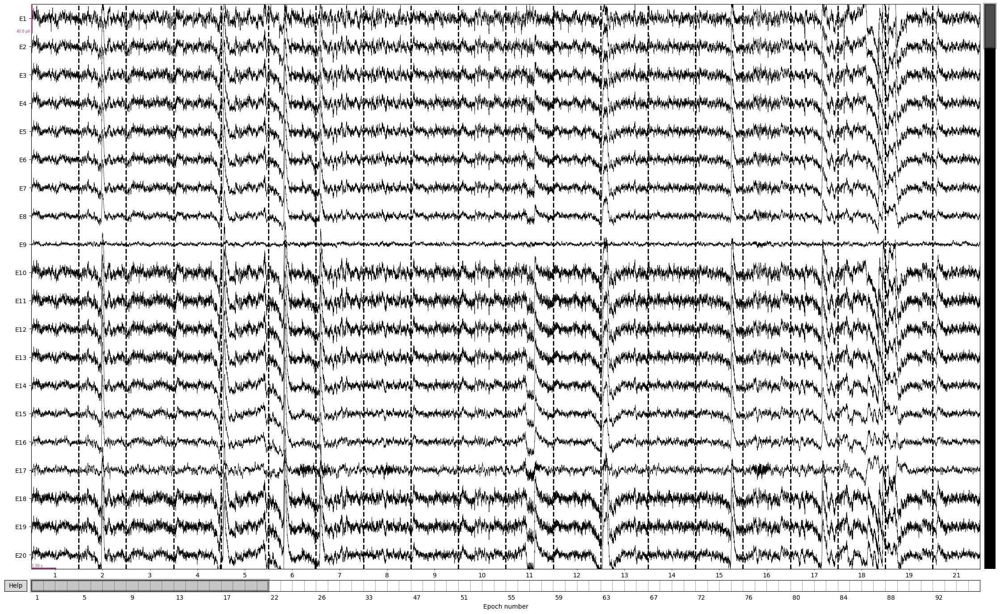

In [28]:
epochs.drop_bad(reject=reject).plot()

In [30]:
from fooof.plts.spectra import plot_spectra
from fooof.analysis import get_band_peak_fg
from fooof.bands import Bands
from fooof import FOOOFGroup

psd = epochs.compute_psd().average()
spectra, freqs = psd.get_data(return_freqs=True)
# Initialize a FOOOFGroup object, with desired settings

fg = FOOOFGroup(
    peak_width_limits=[1, 6],
    min_peak_height=0.15,
    peak_threshold=2.0,
    max_n_peaks=6,
    verbose=False,
)

# Define the frequency range to fit
freq_range = [1, 30]
fg.fit(freqs, spectra, freq_range)
fg.plot()

Using data from preloaded Raw for 80 events and 750 original time points ...
    Using multitaper spectrum estimation with 7 DPSS windows


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_4007/3466902230.py:1: UserWarning: Zero value in spectrum for channel VREF
  psd = epochs.compute_psd().average()


DataError: The input power spectra data, after logging, contains NaNs or Infs. This will cause the fitting to fail. One reason this can happen is if inputs are already logged. Inputs data should be in linear spacing, not log.

Using data from preloaded Raw for 80 events and 750 original time points ...


    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Using data from preloaded Raw for 80 events and 750 original time points ...
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_4007/3263034405.py:1: UserWarning: Zero value in spectrum for channel VREF
  epochs.compute_psd().plot(average=True, picks="data", exclude="bads")
/var/folders/xq/sl7xjp_95qx7wfngy6s6vvg00000gn/T/ipykernel_4007/3263034405.py:1: UserWarning: Infinite value in PSD for channel VREF.
These channels might be dead.
  epochs.compute_psd().plot(average=True, picks="data", exclude="bads")
/Users/daniel/.pyenv/versions/brainlat-3.12.1/lib/python3.12/site-packages/mne/viz/utils.py:165: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


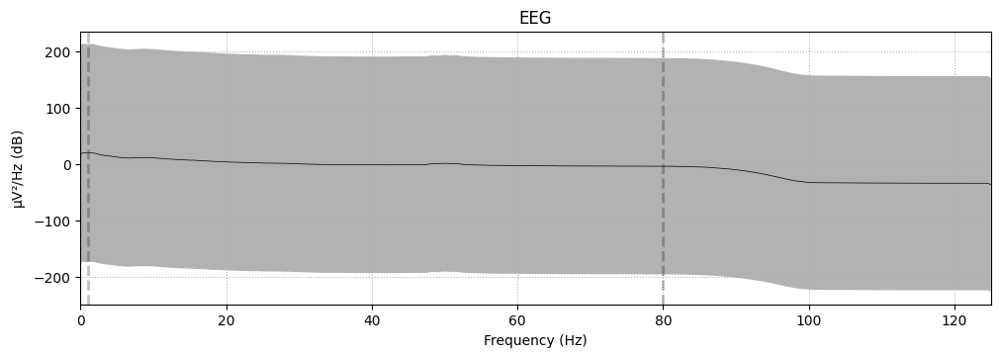

In [31]:
epochs.compute_psd().plot(average=True, picks="data", exclude="bads")
epochs.load_data()
epochs = epochs.set_eeg_reference()

In [126]:
# Define frequency bands of interest
bands = Bands({"theta": [3, 7], "alpha": [7, 14], "beta": [15, 30]})

In [127]:
# Extract alpha peaks
alphas = get_band_peak_fg(fg, bands.alpha)

# Extract the power values from the detected peaks
alpha_pw = alphas[:, 1]

ValueError: Number of channels in the Info object (256) and the data array (255) do not match. Pick Info with e.g. mne.pick_info and mne.channel_indices_by_type.

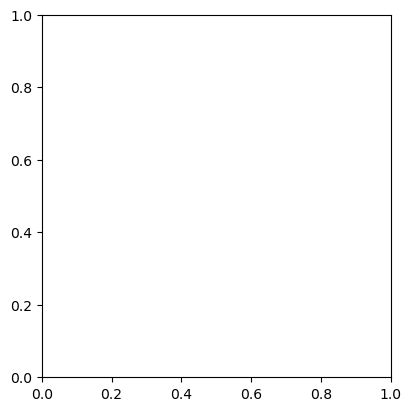

In [129]:
# Plot the topography of alpha power
from matplotlib import cm, colors, colorbar

mne.viz.plot_topomap(alpha_pw, raw.info, cmap=cm.viridis, contours=0, size=4)